## Feature Selection Methods: 

This notebook is experimenting 9 feature selection methods for Math subject Learning Loss, and yielding csv for the result as Feature_Selection_Math_Results.csv and importance_math.csv
- Filter methods:
    - Variance Threshold
- Embedded methods:
    - L1 Regularization (Lasso)
    - Random Forest Feature Importance 
- Wrapper methods:
    - Permutation Importance
        - with Random Forest
        - with Ridge Regression
    - Recursive Feature Elimination (RFE)
        - with Random Forest
        - with Ridge Regression
    - Sequential Feature Selection (SFS)
        - with KNN
        - with Ridge Regression

Then, it is comparing regression coefficients, and creating coef_math.csv
- L1 Regularization (Lasso) 
- L2 Regularization (Ridge)
- ElasticNet

In [38]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
# import warnings 
# warnings.filterwarnings("ignore")

In [39]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, matthews_corrcoef

**Loading Data**

Cleaned and integrated from [Data_Integration.ipynb](Data_Integration.ipynb)

In [40]:
df = pd.read_csv('prepped_with22scores.csv', sep=',', header=0)
print(df.shape)

(1013, 299)


**Get dummies for categorical feature `Locale`**

In [41]:
df.fillna(0,inplace=True)

**Split data**

In [42]:
labels = ['Label Math 2019-2022', 'Label Reading 2019-2022', 'Label Overall 2019-2022']#'Label_Overall 2019-2021']

cols_drop = ['AVG_Math_2022','AVG_Reading_2022',
             'AVG_Math_2021','AVG_Reading_2021',
             'AVG_Math_2019','AVG_Reading_2019',
            '% Students Tested Reading - Grade 3 2018-2019',
            '% Students Tested Reading - Grade 4 2018-2019',
            '% Students Tested Reading - Grade 5 2018-2019',
            '% Students Tested Reading - Grade 6 2018-2019',
            '% Students Tested Reading - Grade 7 2018-2019',
            '% Students Tested Reading - Grade 8 2018-2019',
            '% Students Tested Reading - Grade 3 2020-2021',
            '% Students Tested Reading - Grade 4 2020-2021',
            '% Students Tested Reading - Grade 5 2020-2021',
            '% Students Tested Reading - Grade 6 2020-2021',
            '% Students Tested Reading - Grade 7 2020-2021',
            '% Students Tested Reading - Grade 8 2020-2021',
            '% Students Tested Reading - Grade 3 2021-2022',
            '% Students Tested Reading - Grade 4 2021-2022',
            '% Students Tested Reading - Grade 5 2021-2022',
            '% Students Tested Reading - Grade 6 2021-2022',
            '% Students Tested Reading - Grade 7 2021-2022',
            '% Students Tested Reading - Grade 8 2021-2022',
            'District #','County #']

y = df['Label Math 2019-2022'].values
X = df.drop(columns=labels + cols_drop).values
columns = df.drop(columns=labels + cols_drop).columns

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y,
                                                    random_state=123, shuffle=True)
print(X.shape)

(1013, 270)


**Normalization**

In [43]:
scaler = StandardScaler()

scaler.fit(X_train)
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [44]:
random_state=123
results = pd.DataFrame()
results_coef = pd.DataFrame()

## 9 Feature Selection Methods

### Variance Threshold ###

In [45]:
from sklearn.feature_selection import VarianceThreshold

# dropping columns where 1-threshold of the values are similar
# a feature contains only 0s 80% of the time or only 1s 80% of the time
sel = VarianceThreshold(threshold=.8*(1-.8))

sel.fit_transform(X)
selected_var = columns[sel.get_support()]

temp = pd.DataFrame({'feature': columns,
                     'method': 'Variance Threshold',
                     'model': 'N/A',
                     'score': [1 if ft in selected_var else 0 for ft in columns],
                     'score_type': 'N/A'})
results = pd.concat([results, temp], ignore_index=True)

print('n_features_selected:',selected_var.shape[0])
print('Features Selected: ', selected_var)

n_features_selected: 20
Features Selected:  Index(['CARES ESSER I 20 NORM', 'CRRSA ESSER II 21 NORM',
       'ARP ESSER III 21 NORM', 'Median Age 10', 'Median Age Male 10',
       'Median Age Female 10', '# of Households 10', '# of Families 10',
       '# of Housing Units 10', 'County Population', '42-Rural: Distant',
       '43-Rural: Remote', 'Total Students 2018-2019',
       'Total Students 2020-2021', 'Total Students 2021-2022',
       'Per Capita Income', 'Median Household Income', 'Average Annual Pay',
       '% of Population in Poverty', '% of Population Under 18 in Poverty'],
      dtype='object')


### L1(Lasso) Regularization ###

In [46]:
from sklearn.linear_model import LogisticRegression

lasso = LogisticRegression(penalty='l1', solver='liblinear', C=0.1, multi_class='ovr', random_state=random_state)
lasso.fit(X_train, y_train)

print('Train Accuracy: {:0.2f}'.format(lasso.score(X_train, y_train)))
print('Test Accuracy: {:0.2f}'.format(lasso.score(X_test, y_test)))

df_lasso = pd.DataFrame()

for c, cla in zip(lasso.coef_, ['Loss', 'Expected', 'Gain']):
    temp = pd.DataFrame({'feature': columns, 'model': 'Lasso', 'coef': c, 'label': cla})
    df_lasso = pd.concat([df_lasso, temp], ignore_index=True)
    
results_coef = pd.concat([results_coef, df_lasso], ignore_index=True)
df_lasso2 = df_lasso[df_lasso['label']=="Expected"]

temp = pd.DataFrame({'feature': df_lasso2['feature'], 
                        'method': 'Regularization',
                        'model': 'Lasso', 
                        'score': df_lasso2['coef'],
                        'score_type': 'N/A'})
results = pd.concat([results, temp], ignore_index=True)

Train Accuracy: 0.80
Test Accuracy: 0.69


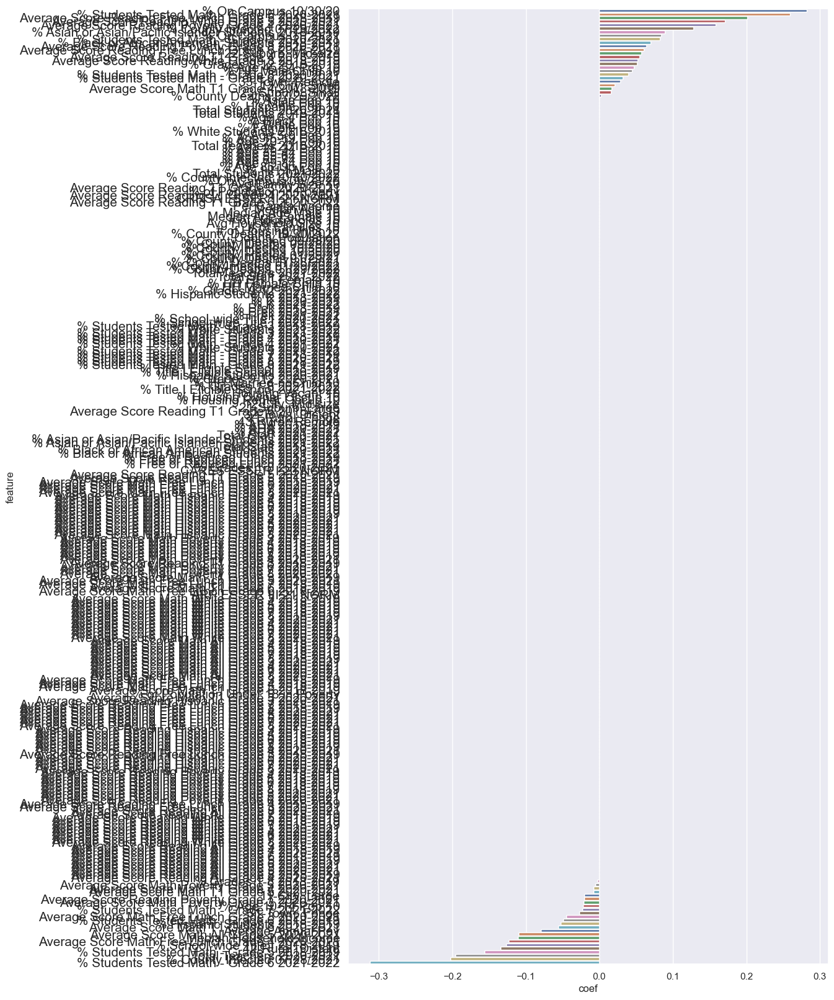

In [47]:
df_lasso2 = df_lasso2.sort_values(by=['coef'], ascending=False)
sns.set(rc={'figure.figsize':(10, 20)})
g=sns.barplot(data=df_lasso2, y="feature", x="coef", palette="deep", orient="h")
# g.set_xticklabels(g.get_xticklabels(), rotation=90, size=20)
g.set_yticklabels(g.get_yticklabels(), size=15)
plt.show()

### Random Forest Feature Importance ###

Train Score: 1.00
Test Score: 0.65


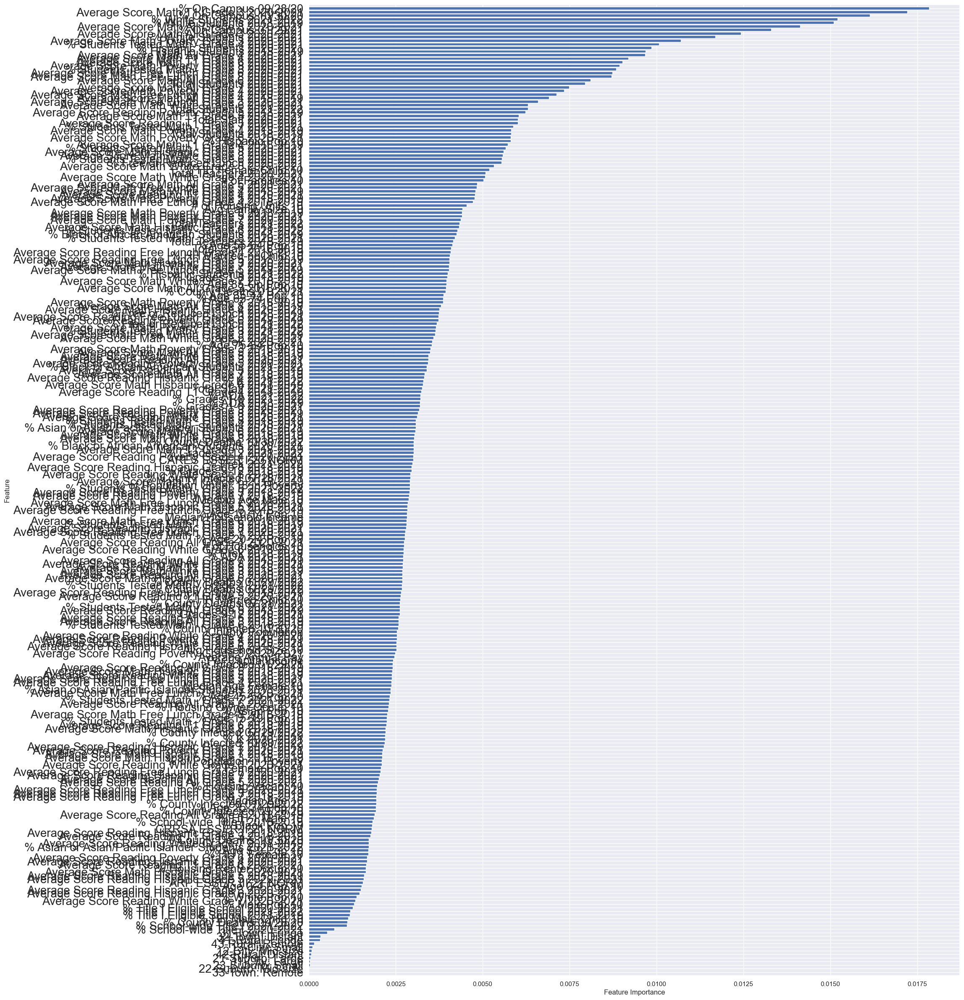

In [48]:
from sklearn.ensemble import RandomForestClassifier

estimator = RandomForestClassifier(random_state=random_state, n_jobs=-1)
estimator.fit(X_train, y_train)
print("Train Score: {:0.2f}".format(estimator.score(X_train, y_train)))
print("Test Score: {:0.2f}".format(estimator.score(X_test, y_test)))

importances = estimator.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(20,30))
plt.xlabel('Feature Importance')
plt.ylabel('Feature')
plt.barh(range(X_train.shape[1]), importances[indices], align='center')
plt.yticks(range(X_train.shape[1]), columns[indices], rotation=0, size=20)
plt.ylim([-1, X_train.shape[1]])
plt.show()

temp = pd.DataFrame({'feature': columns, 
                        'method': 'Feature Importance',
                        'model': 'Random Forest', 
                        'score': importances,
                        'score_type': 'importances'})
results = pd.concat([results, temp], ignore_index=True)

### Permutation Importance ###
with Random Forest

Train Score: 1.00
Test Score: 0.65


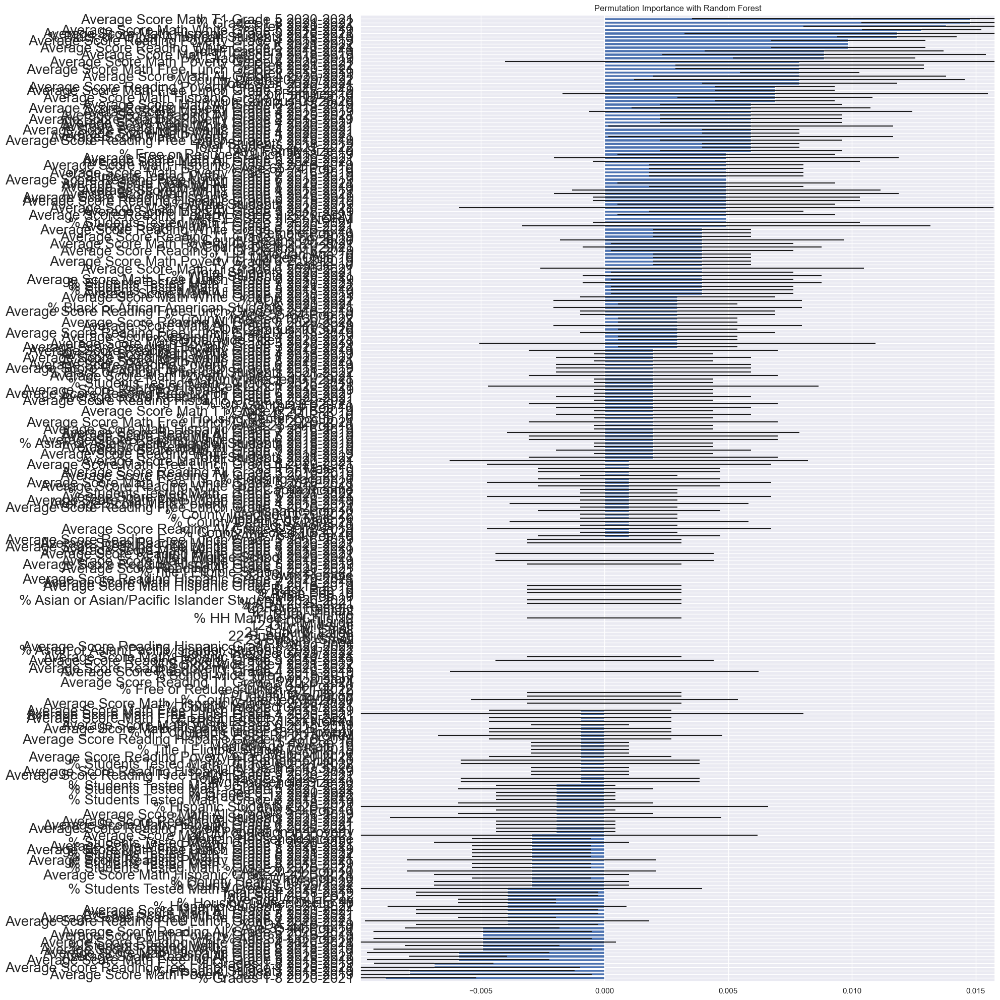

Wall time: 22.3 s


In [49]:
%%time
from sklearn.inspection import permutation_importance

estimator = RandomForestClassifier(random_state=random_state, n_jobs=-1)
estimator.fit(X_train, y_train)
print("Train Score: {:0.2f}".format(estimator.score(X_train, y_train)))
print("Test Score: {:0.2f}".format(estimator.score(X_test, y_test)))

result = permutation_importance(estimator, X=X_test, y=y_test, scoring='accuracy', n_jobs=-1, random_state=random_state)
indices = np.argsort(result['importances_mean'])#[::-1]

plt.figure(figsize=(20,20))
plt.title("Permutation Importance with Random Forest")
plt.barh(range(X_train.shape[1]), result['importances_mean'][indices], xerr=result['importances_std'][indices])

plt.yticks(range(X_train.shape[1]), columns[indices], rotation=0, size=20)
plt.ylim([-1, X_train.shape[1]])
plt.xlim([result['importances_mean'].min()-0.001, result['importances_mean'].max()+0.001])

plt.tight_layout()
plt.show()

temp = pd.DataFrame({'feature': columns, 
                     'method': 'Permutation Importance',
                     'model': 'Random Forest', 
                     'score': result['importances_mean'],
                     'score_type': 'importances_mean'})
results = pd.concat([results, temp], ignore_index=True)

### Permutation Importance ###
with Ridge Regression

Train Score: 0.87
Test Score: 0.67


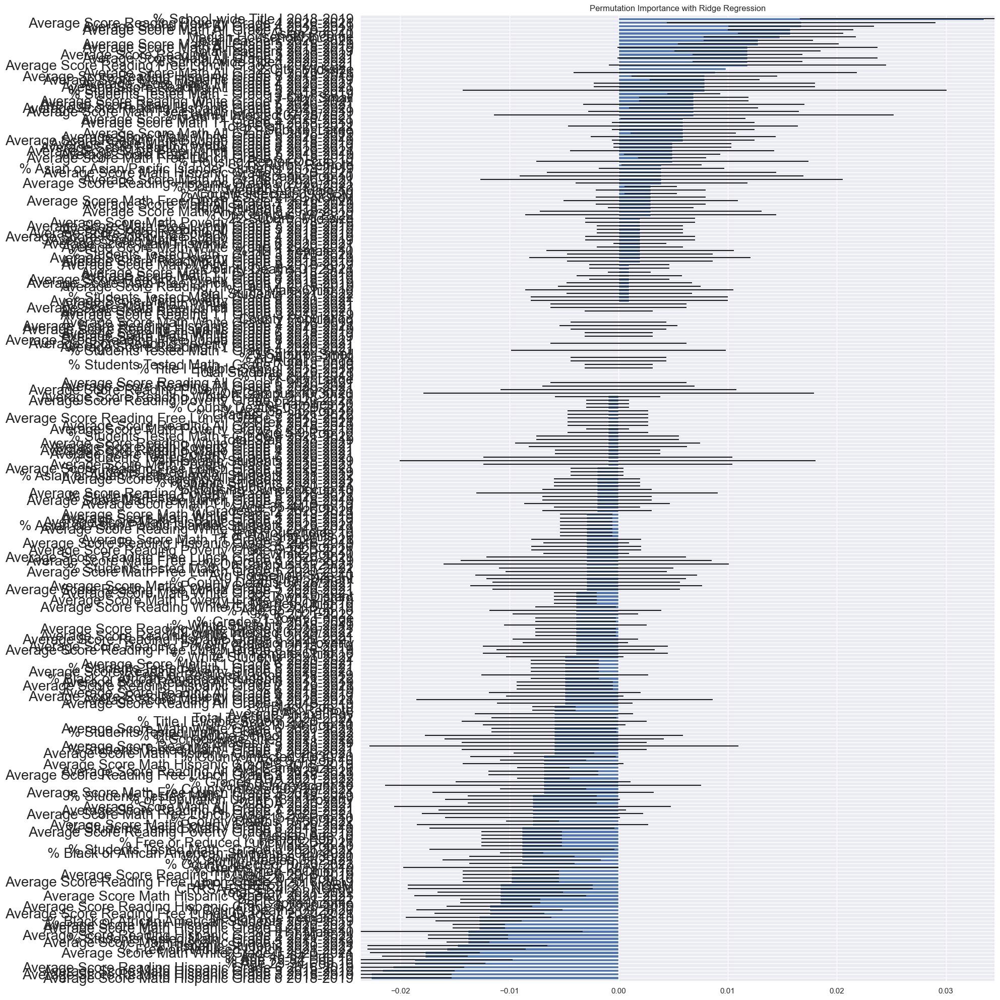

Wall time: 3.01 s


In [50]:
%%time
from sklearn.inspection import permutation_importance
from sklearn.linear_model import LogisticRegression

estimator = LogisticRegression(penalty='l2', solver='liblinear', multi_class='ovr', C=0.1, random_state=random_state)
estimator.fit(X_train, y_train)
print("Train Score: {:0.2f}".format(estimator.score(X_train, y_train)))
print("Test Score: {:0.2f}".format(estimator.score(X_test, y_test)))

result = permutation_importance(estimator, X=X_test, y=y_test, scoring='accuracy', n_jobs=-1, random_state=random_state)
indices = np.argsort(result['importances_mean'])#[::-1]

plt.figure(figsize=(20,20))
plt.title("Permutation Importance with Ridge Regression")
plt.barh(range(X_train.shape[1]), result['importances_mean'][indices], xerr=result['importances_std'][indices])

plt.yticks(range(X_train.shape[1]), columns[indices], rotation=0, size=20)
plt.ylim([-1, X_train.shape[1]])
plt.xlim([result['importances_mean'].min()-0.001, result['importances_mean'].max()+0.001])

plt.tight_layout()
plt.show()

temp = pd.DataFrame({'feature': columns, 
                     'method': 'Permutation Importance',
                     'model': 'Ridge', 
                     'score': result['importances_mean'],
                     'score_type': 'importances_mean'})
results = pd.concat([results, temp], ignore_index=True)

### Recursive Feature Elimination(RFE) ###
with Ridge Regression

In [51]:
%time
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LogisticRegression

estimator = LogisticRegression(penalty='l2', solver='liblinear', multi_class='ovr', random_state=random_state)
estimator.fit(X_train, y_train)
print("Train Score: {:0.2f}".format(estimator.score(X_train, y_train)))
print("Test Score: {:0.2f}".format(estimator.score(X_test, y_test)))

rfe = RFECV(estimator, step=1, cv=10, n_jobs=-1)
sel = rfe.fit(X_train, y_train)
support = sel.support_
n_sel = sel.n_features_

print('n Selected: ', n_sel)
print('Selected Feature: ', columns[support])

temp = pd.DataFrame({'feature': columns, 
                     'method': 'RFE',
                     'model': 'Ridge', 
                     'score': rfe.ranking_,
                     'score_type': 'ranking'})
results = pd.concat([results, temp], ignore_index=True)

Wall time: 0 ns
Train Score: 0.93
Test Score: 0.72
n Selected:  14
Selected Feature:  Index(['Average Score Math All Grade 3 2018-2019',
       'Average Score Math All Grade 4 2018-2019',
       'Average Score Math All Grade 5 2018-2019',
       'Average Score Math All Grade 6 2018-2019',
       'Average Score Math All Grade 7 2018-2019',
       'Average Score Math All Grade 8 2018-2019',
       'Average Score Math All Grade 3 2020-2021',
       'Average Score Math All Grade 4 2020-2021',
       'Average Score Math All Grade 5 2020-2021',
       'Average Score Math All Grade 6 2020-2021',
       'Average Score Math All Grade 7 2020-2021',
       'Average Score Math All Grade 8 2020-2021',
       'Average Score Reading All Grade 8 2018-2019',
       'Average Score Reading All Grade 8 2020-2021'],
      dtype='object')


### Recursive Feature Elimination(RFE) ###
with Random Forest

In [52]:
%time
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier

estimator = RandomForestClassifier(random_state=random_state, n_jobs=-1)
estimator.fit(X_train, y_train)
print("Train Score: {:0.2f}".format(estimator.score(X_train, y_train)))
print("Test Score: {:0.2f}".format(estimator.score(X_test, y_test)))

rfe = RFECV(estimator, step=1, cv=5, n_jobs=-1)
sel = rfe.fit(X_train, y_train)
support = sel.support_
n_sel = sel.n_features_

print('n Selected:', n_sel)
print('Selected Feature: ', columns[support])

temp = pd.DataFrame({'feature': columns, 
                     'method': 'RFE',
                     'model': 'Random Forest', 
                     'score': rfe.ranking_,
                     'score_type': 'ranking'})
results = pd.concat([results, temp], ignore_index=True)

Wall time: 0 ns
Train Score: 1.00
Test Score: 0.65
n Selected: 51
Selected Feature:  Index(['Average Score Math White Grade 5 2020-2021',
       'Average Score Math White Grade 8 2020-2021',
       'Average Score Math All Grade 3 2018-2019',
       'Average Score Math All Grade 4 2018-2019',
       'Average Score Math All Grade 5 2018-2019',
       'Average Score Math All Grade 6 2018-2019',
       'Average Score Math All Grade 8 2018-2019',
       'Average Score Math All Grade 3 2020-2021',
       'Average Score Math All Grade 4 2020-2021',
       'Average Score Math All Grade 5 2020-2021',
       'Average Score Math All Grade 6 2020-2021',
       'Average Score Math All Grade 8 2020-2021',
       'Average Score Math Free Lunch Grade 4 2018-2019',
       'Average Score Math Free Lunch Grade 5 2018-2019',
       'Average Score Math Free Lunch Grade 3 2020-2021',
       'Average Score Math Free Lunch Grade 4 2020-2021',
       'Average Score Math Free Lunch Grade 6 2020-2021',
       'A

### Sequential Feature Selection(SFS) ###
with KNN

In [53]:
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.neighbors import KNeighborsClassifier

estimator = KNeighborsClassifier(n_neighbors=3)
estimator.fit(X_train, y_train)
print("Train Score: {:0.2f}".format(estimator.score(X_train, y_train)))
print("Test Score: {:0.2f}".format(estimator.score(X_test, y_test)))

sfs = SequentialFeatureSelector(estimator, n_jobs=-1, n_features_to_select='auto', tol=None)
sfs.fit(X_train, y_train)

support = sfs.get_support()
n_sel = sfs.n_features_to_select_

print('n Selected:', n_sel)
print('Selected Feature: ', columns[support])

temp = pd.DataFrame({'feature': columns, 
                     'method': 'SFS',
                     'model': 'KNN', 
                     'score': [1 if ft in columns[support] else 0 for ft in columns],
                     'score_type': 'N/A'})
results = pd.concat([results, temp], ignore_index=True)

Train Score: 0.77
Test Score: 0.49
n Selected: 135
Selected Feature:  Index(['Average Score Math White Grade 3 2018-2019',
       'Average Score Math White Grade 4 2018-2019',
       'Average Score Math White Grade 5 2018-2019',
       'Average Score Math White Grade 6 2018-2019',
       'Average Score Math White Grade 7 2018-2019',
       'Average Score Math White Grade 8 2018-2019',
       'Average Score Math White Grade 3 2020-2021',
       'Average Score Math White Grade 4 2020-2021',
       'Average Score Math White Grade 5 2020-2021',
       'Average Score Math White Grade 6 2020-2021',
       ...
       '23-Suburb: Small', '31-Town: Fringe', '33-Town: Remote',
       '43-Rural: Remote', '% Grades 9-12 2020-2021',
       '% Grades 9-12 2021-2022', '% White Students 2020-2021',
       'Total Students 2018-2019', 'Total Students 2020-2021',
       'Total Students 2021-2022'],
      dtype='object', length=135)


### Sequential Feature Selection(SFS) ###
with Ridge Regression

In [54]:
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.linear_model import LogisticRegression

estimator = LogisticRegression(penalty='l2', solver='liblinear', multi_class='ovr', C=0.1, random_state=random_state)
estimator.fit(X_train, y_train)
print("Train Score: {:0.2f}".format(estimator.score(X_train, y_train)))
print("Test Score: {:0.2f}".format(estimator.score(X_test, y_test)))

sfs = SequentialFeatureSelector(estimator, n_jobs=-1, n_features_to_select='auto', tol=None)
sfs.fit(X_train, y_train)

support = sfs.get_support()
n_sel = sfs.n_features_to_select_

print('n Selected:', n_sel)
print('Selected Feature: ', columns[support])

temp = pd.DataFrame({'feature': columns, 
                     'method': 'SFS',
                     'model': 'Ridge', 
                     'score': [1 if ft in columns[support] else 0 for ft in columns],
                     'score_type': 'N/A'})
results = pd.concat([results, temp], ignore_index=True)

Train Score: 0.87
Test Score: 0.67
n Selected: 135
Selected Feature:  Index(['CARES ESSER I 20 NORM', 'CRRSA ESSER II 21 NORM',
       'ARP ESSER III 21 NORM', 'Average Score Math White Grade 5 2018-2019',
       'Average Score Math White Grade 6 2018-2019',
       'Average Score Math White Grade 3 2020-2021',
       'Average Score Math White Grade 4 2020-2021',
       'Average Score Math White Grade 6 2020-2021',
       'Average Score Math White Grade 7 2020-2021',
       'Average Score Math All Grade 3 2018-2019',
       ...
       '% White Students 2020-2021', '% White Students 2021-2022',
       'Total Staff 2021-2022', 'Total Students 2018-2019',
       'Total Students 2020-2021', 'Total Students 2021-2022',
       'Per Capita Income', 'Median Household Income',
       '% of Population in Poverty', '% of Population Under 18 in Poverty'],
      dtype='object', length=135)


### Result: Number of Feature Selected ###

In [55]:
results['selected'] = results['score'].apply(lambda x: 1 if x > 0 else 0)

th_quantile=0.5
th_rf = results[results['method'] == 'Feature Importance']['score'].quantile(th_quantile)
print('Threshold for Random Forest Feature Importance is {:0.4f} at {:0.0f}th percentile'.format(th_rf, th_quantile*100))
results['selected'] = results.apply(lambda x: 0 if ((x.method == 'Feature Importance') & (x.score < th_rf))
                                                 else x.selected, axis=1)
results['selected'] = results.apply(lambda x: 0 if ((x.method == 'RFE') & (x.score > 1))
                                                 else x.selected, axis=1)
results['selected'] = results.apply(lambda x: 1 if ((x.method == 'Regularization') & (x.score != 0))
                                                 else x.selected, axis=1)
              
results['Method'] = results.apply(lambda x: 'Variance Threshold' if x.method == 'Variance Threshold'
                                                                 else str(x.method) + " - " + str(x.model), axis=1)

Threshold for Random Forest Feature Importance is 0.0029 at 50th percentile


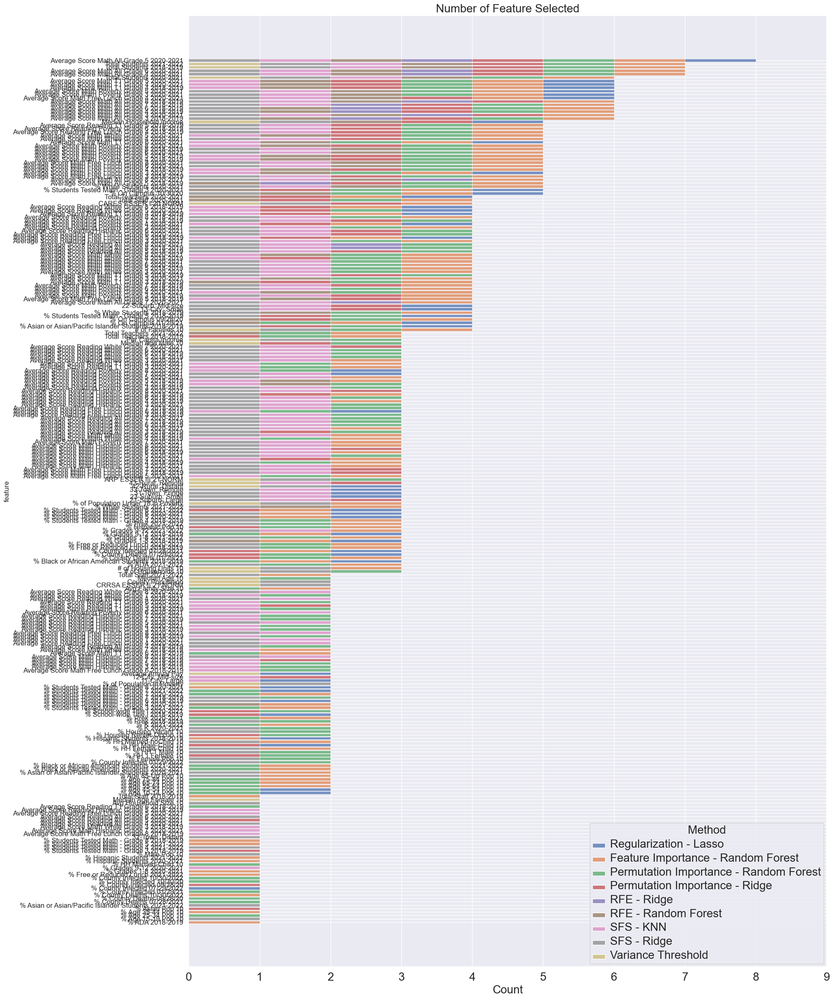

In [56]:
sns.set(rc={'figure.figsize':(20,30)})

features_selected = results[results['selected'] == 1].copy()
features_selected['counts']=features_selected.groupby('feature').transform(lambda x: x.sum())['selected']
features_selected = features_selected.sort_values(by=['counts', 'feature'], ascending=False)

g = sns.histplot(data=features_selected, y='feature', hue='Method', multiple='stack', shrink=0.8, legend=True)
plt.title('Number of Feature Selected', size=20)
plt.xlabel('Count', size=20)
plt.xticks(range(len(features_selected['Method'].unique())+1), list(range(len(features_selected['Method'].unique())+1)), size=20)
plt.yticks(range(len(features_selected.feature.unique())), features_selected.feature.unique(), size=12)
# plt.legend(fontsize=20)
plt.setp(g.get_legend().get_texts(), fontsize='20')
plt.setp(g.get_legend().get_title(), fontsize='20') 
plt.show()

In [57]:
features_selected2 = features_selected.groupby(['feature'], as_index=False).agg({'counts': 'count'})
features_selected2 = features_selected2.sort_values(by=['counts'], ascending=False)
print("Most importance features selected:")
features_selected2[:32]

Most importance features selected:


,feature,counts
106,Average Score Math All Grade 5 2020-2021,8
108,Average Score Math All Grade 6 2020-2021,7
250,Total Students 2021-2022,7
248,Total Students 2018-2019,7
104,Average Score Math All Grade 4 2020-2021,7
103,Average Score Math All Grade 4 2018-2019,6
138,Average Score Math Poverty Grade 3 2020-2021,6
101,Average Score Math All Grade 3 2018-2019,6
102,Average Score Math All Grade 3 2020-2021,6
151,Average Score Math T1 Grade 4 2018-2019,6


In [58]:
results.to_csv('Feature_Selection_Math_Results.csv', index=False)
results

,feature,method,model,score,score_type,selected,Method
0,CARES ESSER I 20 NORM,Variance Threshold,N/A,1.0,N/A,1,Variance Threshold
1,CRRSA ESSER II 21 NORM,Variance Threshold,N/A,1.0,N/A,1,Variance Threshold
2,ARP ESSER III 21 NORM,Variance Threshold,N/A,1.0,N/A,1,Variance Threshold
3,Average Score Math White Grade 3 2018-2019,Variance Threshold,N/A,0.0,N/A,0,Variance Threshold
4,Average Score Math White Grade 4 2018-2019,Variance Threshold,N/A,0.0,N/A,0,Variance Threshold
...,...,...,...,...,...,...,...
2425,Per Capita Income,SFS,Ridge,1.0,N/A,1,SFS - Ridge
2426,Median Household Income,SFS,Ridge,1.0,N/A,1,SFS - Ridge
2427,Average Annual Pay,SFS,Ridge,0.0,N/A,0,SFS - Ridge
2428,% of Population in Poverty,SFS,Ridge,1.0,N/A,1,SFS - Ridge


In [59]:
importance=results.pivot(index="feature", columns="Method", values="score").reset_index()
importance.to_csv('importance_math.csv', index=False)
importance

Method,feature,Feature Importance - Random Forest,Permutation Importance - Random Forest,Permutation Importance - Ridge,RFE - Random Forest,RFE - Ridge,Regularization - Lasso,SFS - KNN,SFS - Ridge,Variance Threshold
0,# of Families 10,0.005027,0.006897,-0.000985,30.0,257.0,0.00000,0.0,1.0,1.0
1,# of Households 10,0.002735,0.000985,-0.002956,81.0,254.0,0.00000,0.0,1.0,1.0
2,# of Housing Units 10,0.004537,0.000000,-0.002956,15.0,239.0,0.00000,0.0,1.0,1.0
3,% ADA 2018-2019,0.003202,-0.003941,0.000000,108.0,174.0,0.00000,0.0,0.0,0.0
4,% ADA 2020-2021,0.002720,0.000000,-0.007882,36.0,11.0,0.00000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
265,Total Students 2020-2021,0.007944,0.003941,0.000000,1.0,233.0,0.00000,1.0,1.0,1.0
266,Total Students 2021-2022,0.006305,0.001970,0.000985,1.0,4.0,0.00000,1.0,1.0,1.0
267,Total Teachers 2018-2019,0.004156,0.008867,0.011823,29.0,59.0,0.00000,0.0,0.0,0.0
268,Total Teachers 2020-2021,0.005088,-0.000985,0.012808,1.0,78.0,-0.19601,0.0,0.0,0.0


## Regression coefficients

### Logistic Regression - Ridge ###

In [60]:
from sklearn.linear_model import LogisticRegression

estimator = LogisticRegression(penalty='l2', solver='liblinear', multi_class='ovr', C=0.1, random_state=random_state)
estimator.fit(X_train, y_train)

print('Train Accuracy: {:0.2f}'.format(estimator.score(X_train, y_train)))
print('Test Accuracy: {:0.2f}'.format(estimator.score(X_test, y_test)))


classes = ['Loss', 'Expected', 'Gain']
for coef, cl in zip(estimator.coef_, classes):
    temp = pd.DataFrame({'feature': columns,
                         'model': 'Ridge',
                         'coef': coef, 
                         'label': cl})
    results_coef = pd.concat([results_coef, temp], ignore_index=True)

Train Accuracy: 0.87
Test Accuracy: 0.67


### Logistic Regression - ElasticNet ###

In [61]:
from sklearn.linear_model import LogisticRegression

estimator = LogisticRegression(penalty='elasticnet', solver='saga', multi_class='ovr', C=0.1, random_state=random_state,
                              l1_ratio=.5, max_iter=10000)
estimator.fit(X_train, y_train)

print('Train Accuracy: {:0.2f}'.format(estimator.score(X_train, y_train)))
print('Test Accuracy: {:0.2f}'.format(estimator.score(X_test, y_test)))


classes = ['Loss', 'Expected', 'Gain']
for coef, cl in zip(estimator.coef_, classes):
    temp = pd.DataFrame({'feature': columns,
                         'model': 'ElasticNet',
                         'coef': coef, 
                         'label': cl})
    results_coef = pd.concat([results_coef, temp], ignore_index=True)

Train Accuracy: 0.82
Test Accuracy: 0.70


In [62]:
coef = results_coef.pivot(index="feature", columns=["model", "label"], values="coef").reset_index()
coef.to_csv('coef_math.csv', index=False)
coef

model                   feature    Lasso                        Ridge  \
label                               Loss Expected      Gain      Loss   
0              # of Families 10  0.00000  0.00000  0.000000  0.007216   
1            # of Households 10  0.00000  0.00000  0.000000  0.012662   
2         # of Housing Units 10  0.00000  0.00000  0.000000  0.011871   
3               % ADA 2018-2019  0.00000  0.00000  0.000000  0.020701   
4               % ADA 2020-2021  0.04431  0.00000 -0.041825  0.264842   
..                          ...      ...      ...       ...       ...   
265    Total Students 2020-2021  0.00000  0.00000  0.000000 -0.006005   
266    Total Students 2021-2022  0.00000  0.00000  0.000000 -0.036941   
267    Total Teachers 2018-2019  0.00000  0.00000  0.000000  0.216917   
268    Total Teachers 2020-2021  0.00000 -0.19601  0.070855 -0.099407   
269    Total Teachers 2021-2022  0.00000  0.00000  0.000000 -0.099209   

model                     ElasticNet                      
label  Expected      Gain       Loss  Expected      Gain  
0     -0.003688 -0.019419   0.000000  0.000000  0.000000  
1      0.005406 -0.035785   0.000000  0.000000 -0.014723  
2      0.008415 -0.036183   0.000000  0.000000 -0.017890  
3      0.058069 -0.129469   0.000000  0.000000  0.000000  
4     -0.004335 -0.202907   0.167163  0.000000 -0.068532  
..          ...       ...        ...       ...       ...  
265   -0.013234 -0.025611   0.000000  0.000000  0.000000  
266    0.067413 -0.027394   0.000000  0.000000  0.000000  
267   -0.209364 -0.014717   0.014222  0.000000  0.000000  
268   -0.312705  0.196542   0.000000 -0.259265  0.079269  
269    0.078319 -0.028666   0.000000  0.000000  0.000000  

[270 rows x 10 columns]